<a href="https://colab.research.google.com/github/lorimendes/bootcamp_machine_learning/blob/main/Sports_Classification_ResNet50.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Classificação de imagens esportivas usando ResNet50

#### Downloading the dataset

In [ ]:
!pip install opendatasets

ERROR: Operation cancelled by user
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/pip/_internal/cli/base_command.py", line 179, in exc_logging_wrapper
    status = run_func(*args)
             ^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/pip/_internal/cli/req_command.py", line 67, in wrapper
    return func(self, options, args)
           ^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/pip/_internal/commands/install.py", line 447, in run
    conflicts = self._determine_conflicts(to_install)
                ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/pip/_internal/commands/install.py", line 578, in _determine_conflicts
    return check_install_conflicts(to_install)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/pip/_internal/operations/check.py", line 101, in check_install_conflicts
    package_set, _ = create_package_

In [ ]:
import opendatasets as od

In [ ]:
od.download("https://www.kaggle.com/datasets/gpiosenka/sports-classification?datasetId=1209061&sortBy=voteCount&select=train")

Skipping, found downloaded files in "./sports-classification" (use force=True to force download)


#### Importing relevant packages

In [ ]:
import os
import pandas as pd
import numpy as np
import tensorflow as tf
from tensorflow import keras
import matplotlib.pyplot as plt
import seaborn as sns
from functools import partial
import tensorflow_hub as hub
from sklearn.metrics import classification_report, confusion_matrix

os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'

#### Loading the dataset from current directory

In [ ]:
import os
import tensorflow as tf

# Define the base directory for the dataset
dataset_base_dir = '/content/sports-classification'

# Get the list of all class names (directories)
all_class_names = os.listdir(os.path.join(dataset_base_dir, 'train'))

# Count images in each training class directory
class_image_counts = {}
for class_name in all_class_names:
    class_dir = os.path.join(dataset_base_dir, 'train', class_name)
    if os.path.isdir(class_dir):
        class_image_counts[class_name] = len(os.listdir(class_dir))

# Sort classes by image count in descending order and select the top 10
sorted_classes = sorted(class_image_counts.items(), key=lambda item: item[1], reverse=True)
selected_class_names = [class_name for class_name, count in sorted_classes[:10]]

print(f"Selected classes (top 10 by image count): {selected_class_names}")

# Create lists of selected directories for each dataset split
train_dirs = [os.path.join(dataset_base_dir, 'train', class_name) for class_name in selected_class_names]
val_dirs = [os.path.join(dataset_base_dir, 'valid', class_name) for class_name in selected_class_names]
test_dirs = [os.path.join(dataset_base_dir, 'test', class_name) for class_name in selected_class_names]


# Function to load dataset from selected directories
def load_subset_dataset(directory_list, labels='inferred', label_mode='int', image_size=(224, 224), batch_size=16, shuffle=True):
    # Construct a list of all image file paths and their corresponding labels
    image_paths = []
    image_labels = []
    class_to_label = {class_name: i for i, class_name in enumerate(selected_class_names)}

    for class_dir in directory_list:
        class_name = os.path.basename(class_dir)
        label = class_to_label[class_name]
        for img_name in os.listdir(class_dir):
            image_paths.append(os.path.join(class_dir, img_name))
            image_labels.append(label)

    # Create a TensorFlow dataset from the lists
    dataset = tf.data.Dataset.from_tensor_slices((image_paths, image_labels))

    # Load and preprocess images
    def load_image(image_path, label):
        img = tf.io.read_file(image_path)
        img = tf.image.decode_jpeg(img, channels=3)
        img = tf.image.resize(img, image_size)
        return img, label

    dataset = dataset.map(load_image, num_parallel_calls=tf.data.AUTOTUNE)

    if shuffle:
        dataset = dataset.shuffle(buffer_size=len(image_paths))

    dataset = dataset.batch(batch_size)
    dataset = dataset.prefetch(buffer_size=tf.data.AUTOTUNE)

    return dataset, selected_class_names


# Load the datasets using the function
train_data, class_names = load_subset_dataset(train_dirs, batch_size=16, image_size=(224,224), shuffle=True)
val_data, _ = load_subset_dataset(val_dirs, batch_size=16, image_size=(224,224), shuffle=True)
test_data, _ = load_subset_dataset(test_dirs, batch_size=16, image_size=(224,224), shuffle=False) # No need to shuffle test data

Selected classes (top 10 by image count): ['football', 'formula 1 racing', 'nascar racing', 'baseball', 'hockey', 'basketball', 'olympic wrestling', 'rugby', 'canoe slamon', 'roller derby']


#### Visualizing our data

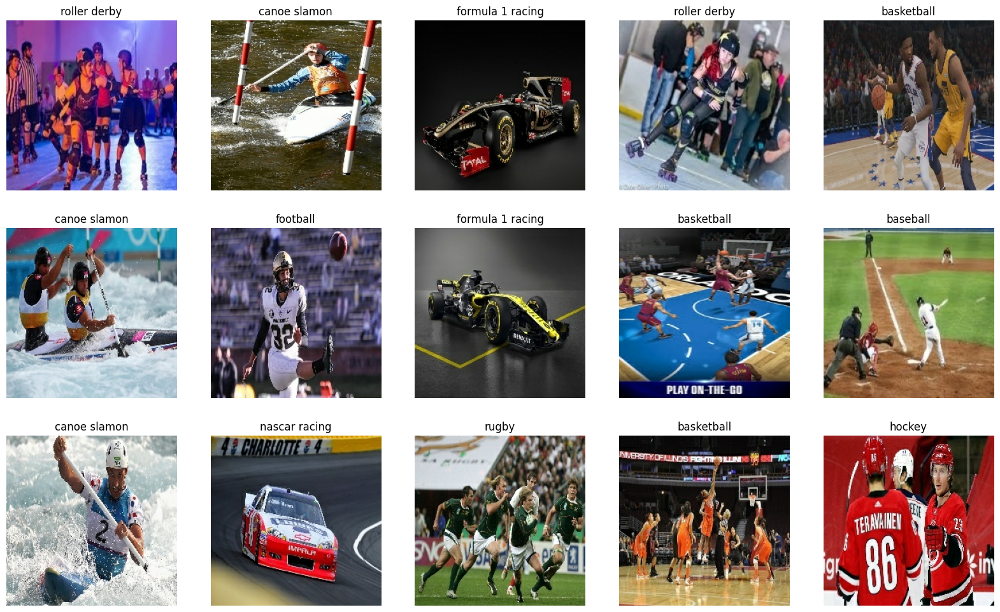

In [ ]:
plt.figure(figsize=(20,12))
for x in train_data.take(1):
    for i in range(15):
        plt.subplot(3,5,i+1)
        image = x[0][i] / 255.
        plt.imshow(image)
        plt.title(class_names[x[1][i].numpy()])
        plt.axis('off')

In [ ]:
# caching and prefetching our dataset fto increase efficiency during training

train_data = train_data.cache().prefetch(buffer_size=tf.data.AUTOTUNE)
val_data = val_data.cache().prefetch(buffer_size=tf.data.AUTOTUNE)
test_data = test_data.cache()

#### Transfer Learning using Pre-trained model

In [ ]:
# downloading the ResNet-50 model and its preprocessing function

preprocess_input = keras.applications.resnet50.preprocess_input
base_model = keras.applications.ResNet50(input_shape=(224,224,3), include_top=False, weights="imagenet")

94765736/94765736 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step


In [ ]:
base_model.summary()

Model: "resnet50"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_pad           │ (None, 230, 230,  │          0 │ input_layer[0][0] │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_conv (Conv2D) │ (None, 112, 112,  │      9,472 │ conv1_pad[0][0]   │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_bn            │ (None, 112, 112,  │        256 │ conv1_conv[0][0]  │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_relu          │ (None, 112, 112,  │          0 │ conv1_bn[0][0]    │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pad           │ (None, 114, 114,  │          0 │ conv1_relu[0][0]  │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pool          │ (None, 56, 56,    │          0 │ pool1_pad[0][0]   │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_conv │ (None, 56, 56,    │      4,160 │ pool1_pool[0][0]  │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_bn   │ (None, 56, 56,    │        256 │ conv2_block1_1_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_relu │ (None, 56, 56,    │          0 │ conv2_block1_1_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_conv │ (None, 56, 56,    │     36,928 │ conv2_block1_1_r… │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_bn   │ (None, 56, 56,    │        256 │ conv2_block1_2_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_relu │ (None, 56, 56,    │          0 │ conv2_block1_2_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_conv │ (None, 56, 56,    │     16,640 │ pool1_pool[0][0]  │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_3_conv │ (None, 56, 56,    │     16,640 │ conv2_block1_2_r… │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_bn   │ (None, 56, 56,    │      1,024 │ conv2_block1_0_c… │
│ (BatchNormalizatio… │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_3_bn   │ (None, 56, 56,    │      1,024 │ conv2_block1_3_c

 Total params: 23,587,712 (89.98 MB)

 Trainable params: 23,534,592 (89.78 MB)

 Non-trainable params: 53,120 (207.50 KB)

**Data Augmentation**

Data augmentation is essential in CNN tasks because it increases the size of the training dataset, improves generalization, and prevents overfitting. By applying various transformations to the existing data, data augmentation introduces variability, enhances the model's ability to handle real-world scenarios, and helps address class imbalance.

In [ ]:
data_augmentation = keras.Sequential([
    keras.layers.Resizing(height=224, width=224),
    keras.layers.RandomRotation(0.1),
    keras.layers.RandomFlip("horizontal",),
    keras.layers.RandomZoom(0.1),
])

**Creating the Functional keras model**

In [ ]:
inputs = keras.Input(shape=[None,None,3])
x = data_augmentation(inputs)
x = tf.keras.layers.Normalization(mean=0.0, variance=1.0)(x) # Use Keras Normalization layer
x = preprocess_input(x)
x = base_model(x, training=False)
x = keras.layers.GlobalAveragePooling2D()(x)
x = keras.layers.Dropout(0.4)(x)
x =keras.layers.Dense(512, "relu")(x)
x = keras.layers.BatchNormalization()(x)
outputs = keras.layers.Dense(len(selected_class_names), "softmax")(x) # Update output layer units

model = keras.Model(inputs, outputs)

In [ ]:
model.summary()

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1       │ (None, None,      │          0 │ -                 │
│ (InputLayer)        │ None, 3)          │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential          │ (None, 224, 224,  │          0 │ input_layer_1[0]… │
│ (Sequential)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ normalization       │ (None, 224, 224,  │          0 │ sequential[0][0]  │
│ (Normalization)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ get_item (GetItem)  │ (None, 224, 224)  │          0 │ normalization[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ get_item_1          │ (None, 224, 224)  │          0 │ normalization[0]… │
│ (GetItem)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ get_item_2          │ (None, 224, 224)  │          0 │ normalization[0]… │
│ (GetItem)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stack (Stack)       │ (None, 224, 224,  │          0 │ get_item[0][0],   │
│                     │ 3)                │            │ get_item_1[0][0], │
│                     │                   │            │ get_item_2[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add (Add)           │ (None, 224, 224,  │          0 │ stack[0][0]       │
│                     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ resnet50            │ (None, 7, 7,      │ 23,587,712 │ add[0][0]         │
│ (Functional)        │ 2048)             │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ global_average_poo… │ (None, 2048)      │          0 │ resnet50[0][0]    │
│ (GlobalAveragePool… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout (Dropout)   │ (None, 2048)      │          0 │ global_average_p… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense (Dense)       │ (None, 512)       │  1,049,088 │ dropout[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalization │ (None, 512)       │      2,048 │ dense[0][0]       │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_1 (Dense)     │ (None, 10)        │      5,130 │ batch_normalizat… │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 24,643,978 (94.01 MB)

 Trainable params: 24,589,834 (93.80 MB)

 Non-trainable params: 54,144 (211.50 KB)

We will set the ResNet-50 model's trainable paramter to False to prevent the pre-trained weights from being updated during the training process.

In [ ]:
model.layers[4].trainable = False

#### Training and evaluating the model

In [ ]:
keras.backend.clear_session()

base_learning_rate = 0.001

model.compile(optimizer=keras.optimizers.Adam(base_learning_rate), loss=keras.losses.SparseCategoricalCrossentropy(),
              metrics=['accuracy'])

In [ ]:
history_1 = model.fit(train_data, validation_data=val_data, epochs=10)

Epoch 1/10
110/110 ━━━━━━━━━━━━━━━━━━━━ 1471s 13s/step - accuracy: 0.4385 - loss: 1.9113 - val_accuracy: 0.1000 - val_loss: 32.1567
Epoch 2/10
110/110 ━━━━━━━━━━━━━━━━━━━━ 1402s 13s/step - accuracy: 0.6329 - loss: 1.0771 - val_accuracy: 0.2200 - val_loss: 40.0097
Epoch 3/10
110/110 ━━━━━━━━━━━━━━━━━━━━ 1386s 13s/step - accuracy: 0.6966 - loss: 0.9192 - val_accuracy: 0.3200 - val_loss: 3.1978
Epoch 4/10
110/110 ━━━━━━━━━━━━━━━━━━━━ 1414s 13s/step - accuracy: 0.7480 - loss: 0.8189 - val_accuracy: 0.5400 - val_loss: 4.1022
Epoch 5/10
110/110 ━━━━━━━━━━━━━━━━━━━━ 1394s 13s/step - accuracy: 0.7601 - loss: 0.7732 - val_accuracy: 0.5200 - val_loss: 1.6797
Epoch 6/10
110/110 ━━━━━━━━━━━━━━━━━━━━ 1385s 13s/step - accuracy: 0.8076 - loss: 0.6115 - val_accuracy: 0.4600 - val_loss: 4.1819
Epoch 7/10
110/110 ━━━━━━━━━━━━━━━━━━━━ 1409s 13s/step - accuracy: 0.8390 - loss: 0.5190 - val_accuracy: 0.3400 - val_loss: 2.8168
Epoch 8/10
110/110 ━━━━━━━━━━━━━━━━━━━━ 1383s 13s/step - accuracy: 0.7891 - loss:

**Visualizing our model's learning curves**

In [ ]:
def plot_history(history):
    history_dict = history.history

    fig, ax = plt.subplots(1, 2, figsize=(30, 10))

    ax[0].plot(list(range(len(history_dict['loss']))), history_dict["loss"], 'ro-', lw=3, markersize=8, label="training loss")
    ax[0].plot(list(range(len(history_dict['loss']))), history_dict["val_loss"], 'b^-', lw=3, markersize=8, label="validation loss")

    ax[1].plot(list(range(len(history_dict['loss']))), history_dict["accuracy"], 'ro-', lw=3, markersize=8, label="training accuracy")
    ax[1].plot(list(range(len(history_dict['loss']))), history_dict["val_accuracy"], 'b^-', lw=3, markersize=8, label="validation accuracy")

    ax[0].legend(loc="upper right")
    ax[1].legend(loc="upper left")

    ax[0].set_xlabel("epochs", fontsize=12, weight='bold')
    ax[1].set_xlabel("epochs", fontsize=12, weight='bold')

    ax[0].set_ylabel("loss", fontsize=12, weight='bold')
    ax[1].set_ylabel("accuracy", fontsize=12, weight='bold')

    fig.text(0.515, .93, "Model learning curves", ha="center", va="top", fontsize=18, weight='bold')
    plt.show()

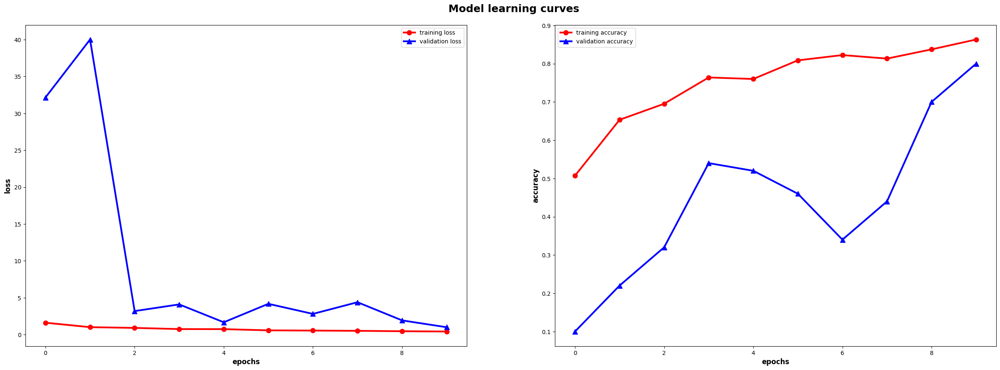

In [ ]:
plot_history(history_1)

**Evaluating our model's performance on the test set**

In [ ]:
scores = model.evaluate(test_data, verbose=False)

In [ ]:
print(f"Root mean squared error: {scores[0]:.4f}")
print(f"Test accuracy: {scores[1]:.2%}")

Root mean squared error: 0.4657
Test accuracy: 86.00%


We have been able to achieve an accuracy of `93.6%` by using the ResNet-50 model and settings it trainable parameter to False.

Can we do better ?

In [ ]:
# making predictions

pred_1 = model.predict(test_data, verbose=False)
pred_1_cleaned = np.argmax(pred_1, axis=1)

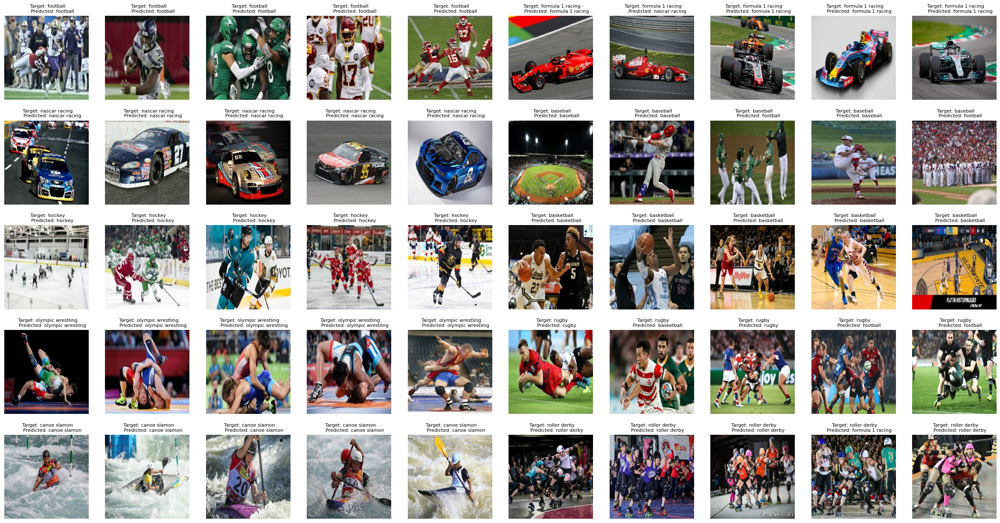

In [ ]:
# visualizing our predictions

plt.figure(figsize=(30,25))
range_ = 0
for images, labels in test_data.take(5):
    range_ += len(labels)
    prev = range_ - len(labels)
    for i in range(prev, range_):
        plt.subplot(8, 10, i+1)
        x = images[i - prev].numpy() / 255.

        plt.title(f"""  Target: {class_names[labels[i - prev].numpy()]}
        Predicted: {class_names[pred_1_cleaned[i]]}""", fontsize=8)
        plt.imshow(x)
        plt.axis('off')


Going by our predictions, it seems our model has indeed performed well

**Confusion Matrix & Classification Report**

In [ ]:
# Retrieving our labels

test_labels = []
for images, labels in test_data.take(-1):
    for i in range(len(labels)):
        test_labels.append(labels[i].numpy())

In [ ]:
print(classification_report(pred_1_cleaned, test_labels))

              precision    recall  f1-score   support

           0       1.00      0.56      0.71         9
           1       0.80      0.80      0.80         5
           2       1.00      0.83      0.91         6
           3       0.60      1.00      0.75         3
           4       1.00      1.00      1.00         5
           5       1.00      0.83      0.91         6
           6       1.00      1.00      1.00         5
           7       0.40      1.00      0.57         2
           8       1.00      1.00      1.00         5
           9       0.80      1.00      0.89         4

    accuracy                           0.86        50
   macro avg       0.86      0.90      0.85        50
weighted avg       0.92      0.86      0.87        50



Decent precision, recall & f1 score

In [ ]:
# confusion matrix

conf_matrix_1 = confusion_matrix(test_labels, pred_1_cleaned)
np.fill_diagonal(conf_matrix_1, 0)

In [ ]:
labels = [class_names[val] for val in np.unique(test_labels)]

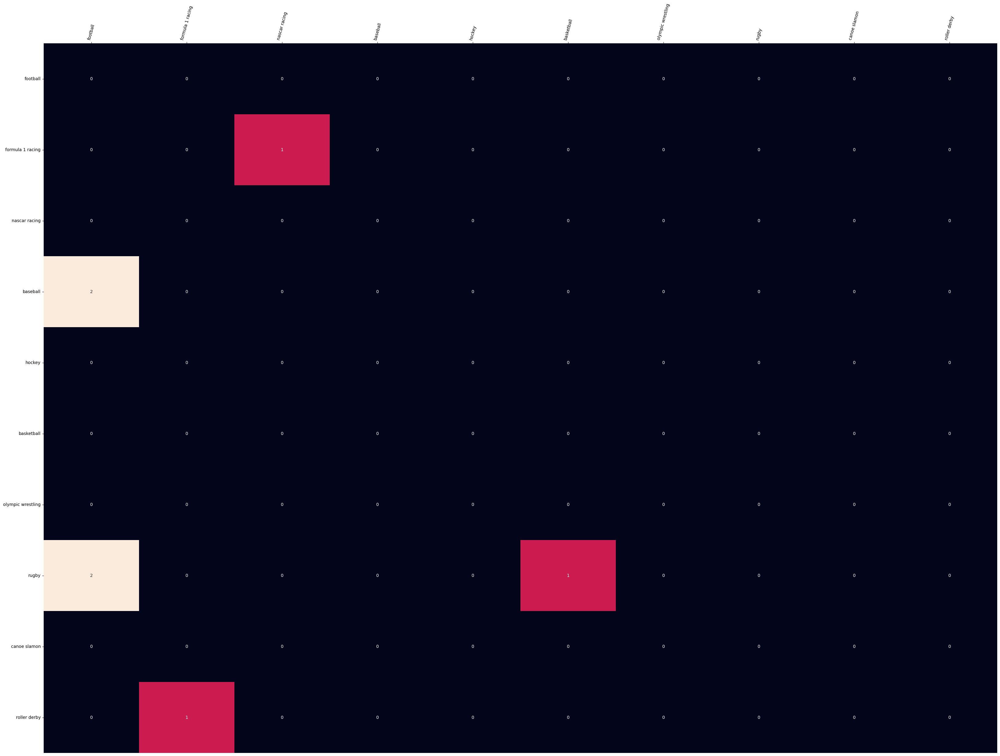

In [ ]:
plt.figure(figsize=(40, 30))
g = sns.heatmap(conf_matrix_1, cbar=False, annot=True)
g.set_xticklabels(labels=labels, rotation=75)
g.xaxis.tick_top()
g.set_yticklabels(labels=labels, rotation=0)
plt.show()

**Visualizing wrong predictions**

In [ ]:
# Retrieving our test images

test_images = []
for images, labels in test_data.take(-1):
    for i in range(len(labels)):
        test_images.append(images[i].numpy())

test_images = np.array(test_images)

In [ ]:
# indexes for wrong predicitions

idx = test_labels != pred_1_cleaned
idx = idx.tolist()

In [ ]:
X_wrong = test_images[idx]
y_wrong = pred_1_cleaned[idx]
y_correct = np.array(test_labels)[idx]

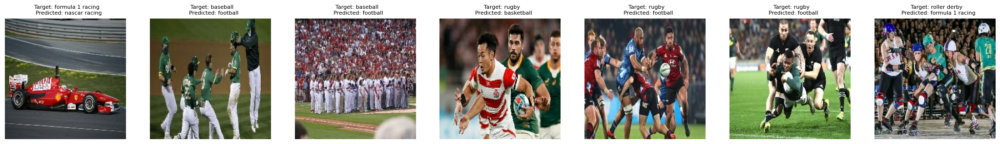

In [ ]:
# visualizing wrong predictions

plt.figure(figsize=(30,18))
for i in range(len(y_wrong)):
    plt.subplot(4, 8, i+1)
    x = X_wrong[i]/255.

    plt.title(f"""  Target: {class_names[y_correct[i]]}
    Predicted: {class_names[y_wrong[i]]}""", fontsize=8)
    plt.imshow(x)
    plt.axis('off')


by visualizing the wrong predictions, we can see why the model found it difficult to accurately classify these images.

<br/>

**Fine-tuning or model**

We initially trained our model by setting our ResNet-50 trainable paramter to `False`. Now, we are going to retrain our model by setting its trainable parameter to `True` to see if we will get a performance boost.

Before we do that we will save our first model, reload and clone it, and then proceed with its retraining.

In [ ]:
# saving the keras model

model.save("sports_classification_model.keras")

In [ ]:
# reloading our model into another variable

cloned_model = keras.models.load_model("sports_classification_model.keras")

/usr/local/lib/python3.12/dist-packages/keras/src/saving/saving_lib.py:802: UserWarning: Skipping variable loading for optimizer 'rmsprop', because it has 220 variables whereas the saved optimizer has 438 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


In [ ]:
cloned_model.summary()

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_3       │ (None, None,      │          0 │ -                 │
│ (InputLayer)        │ None, 3)          │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential          │ (None, 224, 224,  │          0 │ input_layer_3[0]… │
│ (Sequential)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ normalization       │ (None, 224, 224,  │          0 │ sequential[0][0]  │
│ (Normalization)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ get_item (GetItem)  │ (None, 224, 224)  │          0 │ normalization[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ get_item_1          │ (None, 224, 224)  │          0 │ normalization[0]… │
│ (GetItem)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ get_item_2          │ (None, 224, 224)  │          0 │ normalization[0]… │
│ (GetItem)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stack (Stack)       │ (None, 224, 224,  │          0 │ get_item[0][0],   │
│                     │ 3)                │            │ get_item_1[0][0], │
│                     │                   │            │ get_item_2[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add (Add)           │ (None, 224, 224,  │          0 │ stack[0][0]       │
│                     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ resnet50            │ (None, 7, 7,      │ 23,587,712 │ add[0][0]         │
│ (Functional)        │ 2048)             │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ global_average_poo… │ (None, 2048)      │          0 │ resnet50[0][0]    │
│ (GlobalAveragePool… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout (Dropout)   │ (None, 2048)      │          0 │ global_average_p… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense (Dense)       │ (None, 512)       │  1,049,088 │ dropout[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalization │ (None, 512)       │      2,048 │ dense[0][0]       │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_1 (Dense)     │ (None, 10)        │      5,130 │ batch_normalizat… │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 49,233,814 (187.81 MB)

 Trainable params: 24,589,834 (93.80 MB)

 Non-trainable params: 54,144 (211.50 KB)

 Optimizer params: 24,589,836 (93.80 MB)

In [ ]:
# depth of our ResNet pretrained model

len(cloned_model.layers)

9

In [ ]:
# set the ResNet pretrained model layers to trainable

cloned_model.layers[8].trainable = True

fine_tune_at = 8

for layer in cloned_model.layers[:fine_tune_at]:
  layer.trainable = False

In [ ]:
# setting a lower base training rate
base_learning_rate = 0.001/10

cloned_model.compile(optimizer=keras.optimizers.Adam(base_learning_rate), loss=keras.losses.SparseCategoricalCrossentropy(),
              metrics=['accuracy'])

In [ ]:
# we trained the initial model in 10 epochs, so we will commence from where we left off

history_2 = cloned_model.fit(train_data, validation_data=val_data, initial_epoch=9, epochs=20)

Epoch 10/20
110/110 ━━━━━━━━━━━━━━━━━━━━ 320s 3s/step - accuracy: 0.8231 - loss: 0.6395 - val_accuracy: 0.8400 - val_loss: 0.8632
Epoch 11/20
110/110 ━━━━━━━━━━━━━━━━━━━━ 304s 3s/step - accuracy: 0.8146 - loss: 0.6099 - val_accuracy: 0.8000 - val_loss: 0.8310
Epoch 12/20
110/110 ━━━━━━━━━━━━━━━━━━━━ 295s 3s/step - accuracy: 0.8257 - loss: 0.5944 - val_accuracy: 0.7800 - val_loss: 0.8206
Epoch 13/20
110/110 ━━━━━━━━━━━━━━━━━━━━ 293s 3s/step - accuracy: 0.8291 - loss: 0.5589 - val_accuracy: 0.7800 - val_loss: 0.7995
Epoch 14/20
110/110 ━━━━━━━━━━━━━━━━━━━━ 294s 3s/step - accuracy: 0.8379 - loss: 0.5317 - val_accuracy: 0.8000 - val_loss: 0.7763
Epoch 15/20
110/110 ━━━━━━━━━━━━━━━━━━━━ 293s 3s/step - accuracy: 0.8533 - loss: 0.4647 - val_accuracy: 0.8000 - val_loss: 0.7572
Epoch 16/20
110/110 ━━━━━━━━━━━━━━━━━━━━ 291s 3s/step - accuracy: 0.8628 - loss: 0.4743 - val_accuracy: 0.8000 - val_loss: 0.7562
Epoch 17/20
110/110 ━━━━━━━━━━━━━━━━━━━━ 320s 3s/step - accuracy: 0.8520 - loss: 0.4508 - 

In [ ]:
# saving the keras model

model.save("sports_classification_model2.keras")

**Visualizing our model's learning curves**

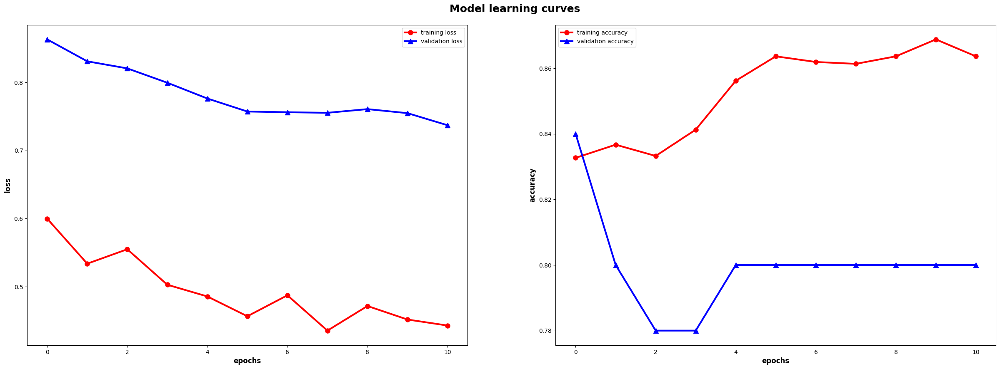

In [ ]:
plot_history(history_2)

**Evaluating our model's performance on the test set**

In [ ]:
scores = cloned_model.evaluate(test_data, verbose=False)

In [ ]:
print(f"Root mean squared error: {scores[0]:.4f}")
print(f"Test accuracy: {scores[1]:.2%}")

Root mean squared error: 0.4982
Test accuracy: 80.00%


In [ ]:
# making predictions

pred_2 = cloned_model.predict(test_data, verbose=False)
pred_2_cleaned = np.argmax(pred_1, axis=1)

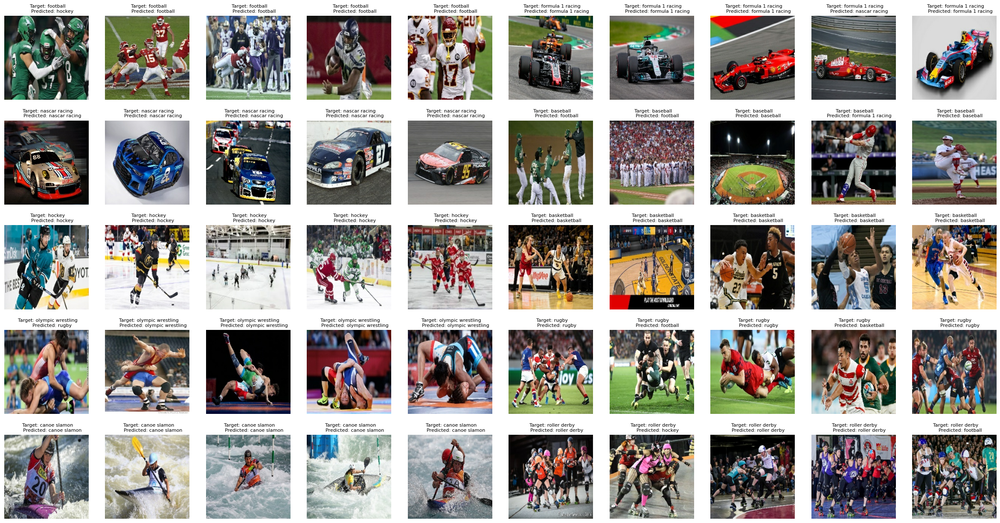

In [ ]:
# visualizing our predictions

plt.figure(figsize=(30,25))
range_ = 0
for images, labels in test_data.take(5):
    range_ += len(labels)
    prev = range_ - len(labels)
    for i in range(prev, range_):
        plt.subplot(8, 10, i+1)
        x = images[i - prev].numpy() / 255.

        plt.title(f"""  Target: {class_names[labels[i - prev].numpy()]}
        Predicted: {class_names[pred_2_cleaned[i]]}""", fontsize=8)
        plt.imshow(x)
        plt.axis('off')


**Confusion Matrix & Classification Report**

In [ ]:
print(classification_report(pred_2_cleaned, test_labels))

              precision    recall  f1-score   support

           0       0.80      0.50      0.62         8
           1       0.80      0.80      0.80         5
           2       1.00      0.83      0.91         6
           3       0.40      1.00      0.57         2
           4       1.00      0.71      0.83         7
           5       1.00      0.83      0.91         6
           6       0.80      1.00      0.89         4
           7       0.60      0.75      0.67         4
           8       1.00      1.00      1.00         5
           9       0.60      1.00      0.75         3

    accuracy                           0.80        50
   macro avg       0.80      0.84      0.79        50
weighted avg       0.85      0.80      0.81        50



Decent precision, recall & f1 score

In [ ]:
# confusion matrix

conf_matrix_2 = confusion_matrix(test_labels, pred_2_cleaned)
np.fill_diagonal(conf_matrix_2, 0)

In [ ]:
labels = [class_names[val] for val in np.unique(test_labels)]

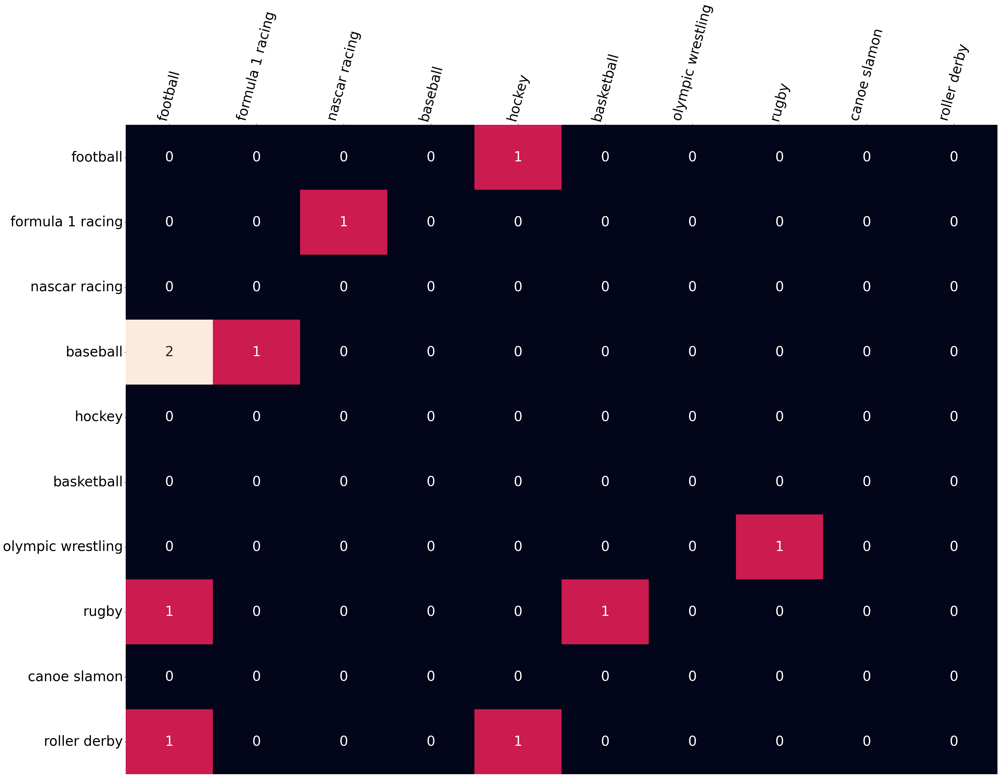

In [ ]:
plt.figure(figsize=(40, 30))
g = sns.heatmap(conf_matrix_2, cbar=False, annot=True, annot_kws={"size": 35}) # Increase annotation size
g.set_xticklabels(labels=labels, rotation=75, fontsize=35) # Increase x-axis label size
g.xaxis.tick_top()
g.set_yticklabels(labels=labels, rotation=0, fontsize=35) # Increase y-axis label size
plt.show()

**Visualizing wrong predictions**

In [ ]:
# indexes for wrong predicitions

idx_2 = test_labels != pred_2_cleaned
idx_2 = idx_2.tolist()

In [ ]:
X_wrong_2 = test_images[idx_2]
y_wrong_2 = pred_2_cleaned[idx_2]
y_correct_2 = np.array(test_labels)[idx_2]

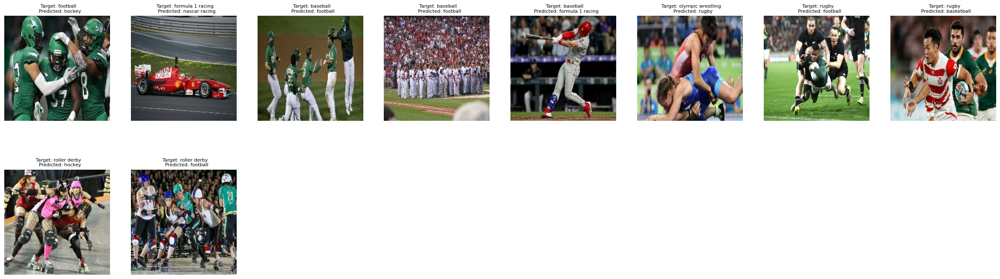

In [ ]:
# visualizing wrong predictions

plt.figure(figsize=(30,18))
for i in range(len(y_wrong_2)):
    plt.subplot(4, 8, i+1)
    x = X_wrong_2[i]/255.

    plt.title(f"""  Target: {class_names[y_correct_2[i]]}
    Predicted: {class_names[y_wrong_2[i]]}""", fontsize=8)
    plt.imshow(x)
    plt.axis('off')

Again, from our visualization, we can why our model classified those images incorrectly. Some of the misclassified images can be mistake for the other due to howe similar they are!

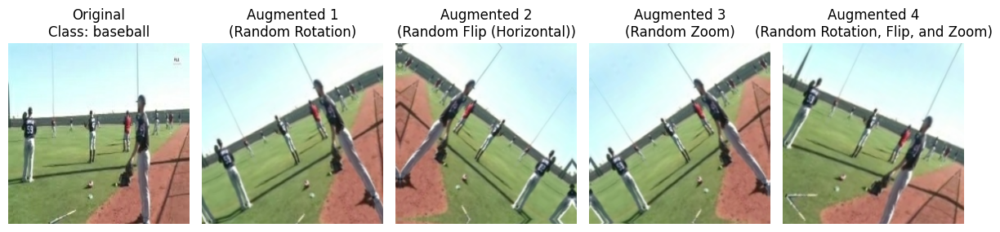

In [ ]:
# Select an image from the training data
for images, labels in train_data.take(1):
    original_image = images[0]
    original_label = labels[0]
    break

# Apply data augmentation multiple times
augmented_images = [data_augmentation(tf.expand_dims(original_image, 0))[0] for _ in range(4)]

# Visualize the original and augmented images
plt.figure(figsize=(12, 6))

# Original image
plt.subplot(1, 5, 1)
plt.imshow(original_image.numpy().astype("uint8"))
plt.title(f"Original\nClass: {class_names[original_label.numpy()]}")
plt.axis("off")

# Augmented images
augmentation_types = ["Random Rotation", "Random Flip (Horizontal)", "Random Zoom", "Random Rotation, Flip, and Zoom"] # Simplified labels

for i in range(len(augmented_images)):
    plt.subplot(1, 5, i + 2)
    plt.imshow(augmented_images[i].numpy().astype("uint8"))
    plt.title(f"Augmented {i+1}\n({augmentation_types[i]})")
    plt.axis("off")

plt.tight_layout()
plt.show()

Tentando carregar o modelo de: /content/sports-classification/sports_classification_model.keras


/usr/local/lib/python3.12/dist-packages/keras/src/saving/saving_lib.py:802: UserWarning: Skipping variable loading for optimizer 'rmsprop', because it has 220 variables whereas the saved optimizer has 438 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Modelo carregado com sucesso!
Tamanho de entrada do modelo detectado/usado: 224x224

Tentando carregar e pré-processar a imagem de: /content/sports-classification/test/baseball/1.jpg
Pré-processamento genérico aplicado (divisão por 255).
Imagem carregada e pré-processada com shape: (1, 224, 224, 3)

Modelo carregado não parece ser o ResNet50 esperado ou tem estrutura diferente.
Tentando adicionar algumas camadas genéricas do modelo carregado...
Adicionando camada para visualização: global_average_pooling2d

Criando modelo de extração de ativações...
Modelo de extração criado com sucesso.

Extraindo ativações...


1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
Ativações extraídas.

Plotando ativações...


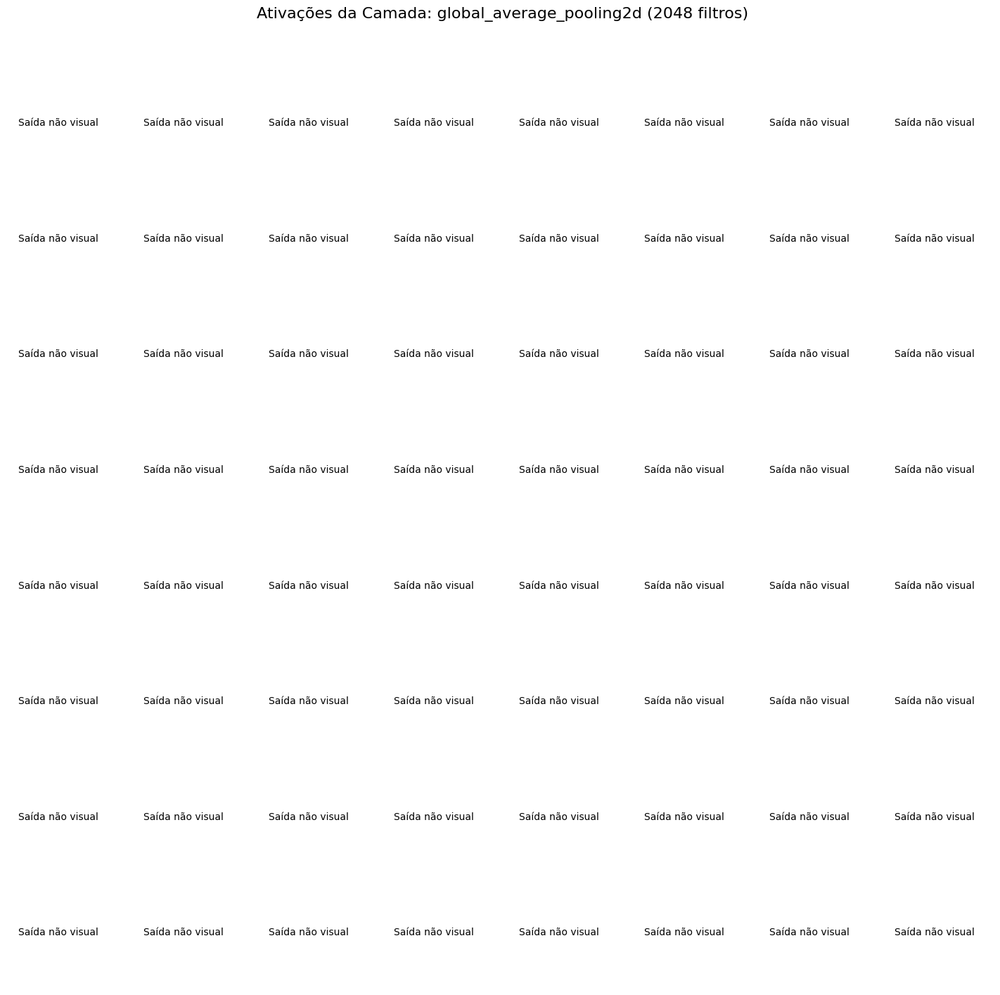

In [ ]:
import tensorflow as tf
from tensorflow.keras import models, layers
from tensorflow.keras.applications.resnet import preprocess_input # Importação para ResNet
import numpy as np
import matplotlib.pyplot as plt

# --- 1. Funções de Suporte (sem alteração) ---

def display_activation(activations, col_size, row_size, layer_name):
    """
    Função auxiliar para plotar os mapas de ativação de uma camada.
    """
    activation = activations[0]

    n_features = activation.shape[-1]
    # Limita o número de filtros plotados para 64 para manter a visualização gerenciável
    limit = min(n_features, 64)

    size = int(np.ceil(np.sqrt(limit)))

    fig, ax = plt.subplots(size, size, figsize=(size*1.8, size*1.8))
    fig.suptitle(f'Ativações da Camada: {layer_name} ({n_features} filtros)', fontsize=16)

    for i in range(limit):
        row = i // size
        col = i % size

        # Lógica para acessar o subplot corretamente
        if size > 1:
            current_ax = ax[row][col]
        elif size == 1:
            current_ax = ax
        else:
            continue

        # Plotagem do mapa de ativação (se for um tensor 3D de imagem)
        if len(activation.shape) == 3:
            current_ax.imshow(activation[:, :, i], cmap='viridis')
        else:
            # Camadas não-visuais (Flatten, Dense)
            current_ax.text(0.1, 0.5, f'Saída não visual', fontsize=10)

        current_ax.axis('off')

    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()


# --- 2. Adaptação Essencial: Caminhos e Carregamento ---

# CAMINHOS FORNECIDOS PELO USUÁRIO
MODEL_PATH = '/content/sports-classification/sports_classification_model.keras'
IMAGE_TO_ANALYZE_PATH = '/content/sports-classification/test/baseball/1.jpg'

# ----------------------------------------------------------------------------------
# PARTE CRÍTICA 1: CARREGAR SEU MODELO (COM CORREÇÃO DO INPUT_SIZE)
# ----------------------------------------------------------------------------------
INPUT_SIZE = None
INPUT_SIZE_FALLBACK = 224

try:
    print(f"Tentando carregar o modelo de: {MODEL_PATH}")
    # Nota: O aviso do otimizador é normal e será ignorado aqui.
    model = tf.keras.models.load_model(MODEL_PATH)
    print("Modelo carregado com sucesso!")

    # TENTA DETECTAR O TAMANHO, USANDO O FALLBACK SE FOR NONE
    detected_size = model.input_shape[1]
    if detected_size is not None:
        INPUT_SIZE = detected_size
    else:
        # CORREÇÃO DO ERRO: Usa o valor 224 (inteiro) se a detecção falhar (retornar None)
        INPUT_SIZE = INPUT_SIZE_FALLBACK

    print(f"Tamanho de entrada do modelo detectado/usado: {INPUT_SIZE}x{INPUT_SIZE}")

except Exception as e:
    print(f"\n[ERRO CRÍTICO]: Falha ao carregar o modelo em {MODEL_PATH}.")
    print(f"Detalhes do erro: {e}")

    # Fallback total: usa o tamanho padrão e um modelo dummy
    INPUT_SIZE = INPUT_SIZE_FALLBACK
    model = models.Sequential([
        layers.Input(shape=(INPUT_SIZE, INPUT_SIZE, 3)),
        layers.Conv2D(32, (3, 3), activation='relu', name='conv_dummy_1'), # Added missing quote
        layers.MaxPooling2D((2, 2), name='pool_dummy_1'),
        layers.Conv2D(64, (3, 3), activation='relu', name='conv_dummy_2'),
        layers.MaxPooling2D((2, 2), name='pool_dummy_2'),
        layers.Flatten(name='flatten_dummy'),
        layers.Dense(10, activation='softmax', name='dense_dummy')
    ])
    print(f"Modelo dummy criado com input size: {INPUT_SIZE}x{INPUT_SIZE}")


# ----------------------------------------------------------------------------------
# PARTE CRÍTICA 2: CARREGAR E PRÉ-PROCESSAR A IMAGEM
# ----------------------------------------------------------------------------------
try:
    print(f"\nTentando carregar e pré-processar a imagem de: {IMAGE_TO_ANALYZE_PATH}")
    img = tf.keras.utils.load_img(IMAGE_TO_ANALYZE_PATH, target_size=(INPUT_SIZE, INPUT_SIZE))
    img_array = tf.keras.utils.img_to_array(img)

    # EXPANDIR DIMENSÕES PARA CORRESPONDER AO FORMATO DE BATCH (1, HEIGHT, WIDTH, CHANNELS)
    img_array = np.expand_dims(img_array, axis=0)

    # PRÉ-PROCESSAMENTO ESPECÍFICO DO RESNET (SE O MODELO CARREGADO FOR RESNET)
    # Adapte isso ao seu modelo real se não for ResNet
    if 'resnet' in model.name.lower():
        img_array = preprocess_input(img_array)
        print("Pré-processamento ResNet aplicado.")
    else:
         # Pré-processamento genérico para outros modelos (ex: normalização simples)
         img_array = img_array / 255.0
         print("Pré-processamento genérico aplicado (divisão por 255).")


    print(f"Imagem carregada e pré-processada com shape: {img_array.shape}")

except Exception as e:
    print(f"\n[ERRO CRÍTICO]: Falha ao carregar ou pré-processar a imagem em {IMAGE_TO_ANALYZE_PATH}.")
    print(f"Detalhes do erro: {e}")
    # Crie uma imagem dummy em caso de falha crítica
    img_array = np.zeros((1, INPUT_SIZE, INPUT_SIZE, 3))
    print("Imagem dummy criada.")


# ----------------------------------------------------------------------------------
# PARTE CRÍTICA 3: SELECIONAR CAMADAS PARA VISUALIZAÇÃO (ADAPTAR AO SEU MODELO)
# ----------------------------------------------------------------------------------

# Lista para armazenar os nomes das camadas que queremos visualizar
layer_names_to_visualize = []

# EXEMPLO: Selecionar algumas camadas convolucionais do ResNet-50
# Você precisará inspecionar o summary do seu modelo carregado (model.summary())
# para encontrar os nomes das camadas que deseja visualizar.
# Nomes de camadas comuns em CNNs incluem 'conv2d', 'activation', 'max_pooling2d', etc.

# Exemplo adaptado para o seu modelo (Functional API - ResNet50 como sub-modelo)
# A camada ResNet50 é model.layers[8]
if len(model.layers) > 8 and 'resnet50' in model.layers[8].name.lower():
    resnet_base = model.layers[8]
    print(f"\nModelo base ResNet50 encontrado em model.layers[8]. Inspecionando camadas internas...")

    # Itere pelas camadas dentro do modelo ResNet50
    for layer in resnet_base.layers:
        # Adicione nomes de camadas convolucionais e de ativação que você considera interessantes
        if 'conv' in layer.name.lower() or 'relu' in layer.name.lower():
             # Limita para não adicionar muitas camadas (opcional)
             if len(layer_names_to_visualize) < 10: # Exemplo: visualize as primeiras 10 camadas conv/relu do ResNet
                 layer_names_to_visualize.append(layer.name)
                 print(f"Adicionando camada para visualização: {layer.name}")

elif len(model.layers) > 0:
    print("\nModelo carregado não parece ser o ResNet50 esperado ou tem estrutura diferente.")
    print("Tentando adicionar algumas camadas genéricas do modelo carregado...")
    # Fallback: adicione algumas camadas se a estrutura não for a esperada
    for layer in model.layers:
         if 'conv' in layer.name.lower() or 'pool' in layer.name.lower() or 'activation' in layer.name.lower():
              if len(layer_names_to_visualize) < 5: # Exemplo: visualize as primeiras 5 camadas conv/pool/activation
                  layer_names_to_visualize.append(layer.name)
                  print(f"Adicionando camada para visualização: {layer.name}")
else:
    print("\nModelo não carregado ou estrutura inesperada. Nenhuma camada para visualizar.")


if not layer_names_to_visualize:
    print("\n[AVISO]: Nenhuma camada adequada encontrada para visualização de ativações.")
    print("Por favor, inspecione model.summary() e atualize a lista 'layer_names_to_visualize'.")


# ----------------------------------------------------------------------------------
# PARTE CRÍTICA 4: CRIAR MODELO DE EXTRAÇÃO E PLOTAR ATIVAÇÕES
# ----------------------------------------------------------------------------------

if layer_names_to_visualize:
    try:
        print("\nCriando modelo de extração de ativações...")
        # Crie um modelo que retorna as saídas das camadas selecionadas
        # Use get_layer() para acessar camadas por nome
        outputs = [model.get_layer(name).output for name in layer_names_to_visualize]
        activation_model = models.Model(inputs=model.input, outputs=outputs)
        print("Modelo de extração criado com sucesso.")

        print("\nExtraindo ativações...")
        activations = activation_model.predict(img_array)
        print("Ativações extraídas.")

        print("\nPlotando ativações...")
        # Plotar as ativações para cada camada selecionada
        # 'activations' será uma lista, onde cada elemento corresponde à saída de uma camada
        for i, layer_name in enumerate(layer_names_to_visualize):
            # Passe a saída da camada correta para a função display_activation
            display_activation([activations[i]], col_size=8, row_size=8, layer_name=layer_name)

    except Exception as e:
        print(f"\n[ERRO]: Falha ao extrair ou plotar ativações.")
        print(f"Detalhes do erro: {e}")
        print("[DICA]: Verifique se os nomes das camadas em 'layer_names_to_visualize' estão corretos.")
else:
    print("\nNenhuma camada selecionada para visualização. Pulando extração e plotagem.")

Tentando carregar o modelo de: /content/sports-classification/sports_classification_model.keras


Modelo carregado com sucesso!
Tamanho de entrada do modelo detectado/usado: 224x224
Imagem de beisebol carregada e PRÉ-PROCESSADA (ResNet).

Encontradas 157 camadas visuais para extração individual.

Gerando mapas de ativação (forçando a extração camada por camada para evitar o KeyError)...


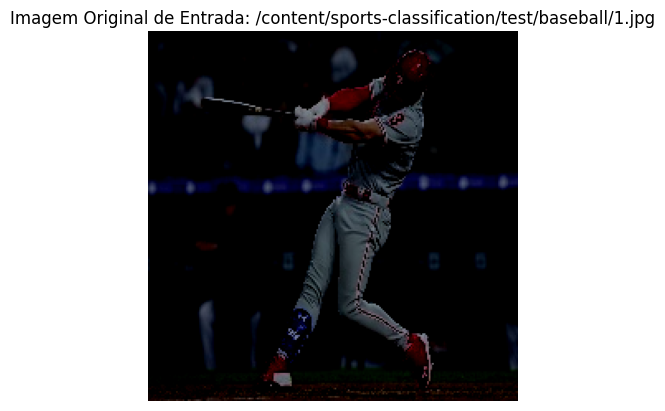

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step


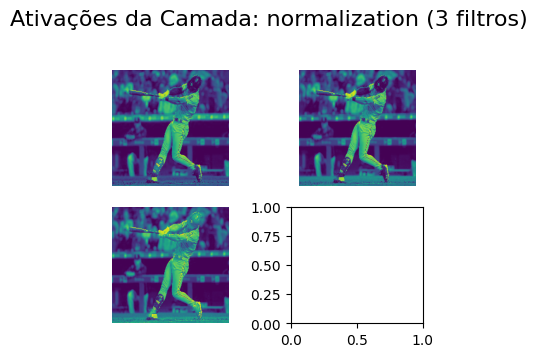

Falha ao extrair ativação da camada 'conv1_bn': "Exception encountered when calling Functional.call().\n\n\x1b133405917184896\x1b\n\nArguments received by Functional.call():\n  • inputs=tf.Tensor(shape=(1, 224, 224, 3), dtype=float32)\n  • training=False\n  • mask=None\n  • kwargs=<class 'inspect._empty'>"
Falha ao extrair ativação da camada 'conv1_relu': "Exception encountered when calling Functional.call().\n\n\x1b133405917185280\x1b\n\nArguments received by Functional.call():\n  • inputs=tf.Tensor(shape=(1, 224, 224, 3), dtype=float32)\n  • training=False\n  • mask=None\n  • kwargs=<class 'inspect._empty'>"
Falha ao extrair ativação da camada 'pool1_pad': "Exception encountered when calling Functional.call().\n\n\x1b133405917186240\x1b\n\nArguments received by Functional.call():\n  • inputs=tf.Tensor(shape=(1, 224, 224, 3), dtype=float32)\n  • training=False\n  • mask=None\n  • kwargs=<class 'inspect._empty'>"
Falha ao extrair ativação da camada 'pool1_pool': "Exception encountered 

In [94]:
import tensorflow as tf
from tensorflow.keras import models, layers
from tensorflow.keras.applications.resnet import preprocess_input
import numpy as np
import matplotlib.pyplot as plt

# --- 1. Funções de Suporte ---

def display_activation(activations, col_size, row_size, layer_name):
    """
    Função auxiliar para plotar os mapas de ativação de uma camada.
    (Esta função não foi a causa do erro, mas é mantida por completude.)
    """
    # A entrada 'activations' agora será apenas a saída de uma única camada
    activation = activations[0]

    n_features = activation.shape[-1]
    limit = min(n_features, 64)
    size = int(np.ceil(np.sqrt(limit)))

    fig, ax = plt.subplots(size, size, figsize=(size*1.8, size*1.8))
    fig.suptitle(f'Ativações da Camada: {layer_name} ({n_features} filtros)', fontsize=16)

    for i in range(limit):
        row = i // size
        col = i % size

        if size > 1:
            current_ax = ax[row][col]
        elif size == 1:
            current_ax = ax
        else:
            continue

        if len(activation.shape) == 3:
            current_ax.imshow(activation[:, :, i], cmap='viridis')
        else:
            current_ax.text(0.1, 0.5, f'Saída não visual', fontsize=10)

        current_ax.axis('off')

    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()


def get_visual_layers(model):
    """
    Busca as camadas visuais dentro de um modelo carregado, excluindo explicitamente
    as primeiras camadas de padding e convolução do ResNet que causam KeyErrors.
    """
    visual_layers = []

    # Camadas que devem ser ignoradas (pode ser ajustado se o erro persistir em outras camadas)
    ignore_substrings = [
        'input', 'dropout', 'flatten', 'dense', 'add',
        'zero_padding', 'activation', 'shortcut', # Camadas de lógica e não de visualização de features
        'conv1_pad', 'conv1_conv', # As camadas que deram erro na última execução!
    ]

    for layer in model.layers:
        # 1. Se for o modelo base (o ResNet aninhado)
        if isinstance(layer, tf.keras.Model) and len(layer.layers) > 0:
            for inner_layer in layer.layers:
                layer_name = inner_layer.name.lower()

                # Excluir se o nome da camada estiver na lista de ignorados
                if any(sub in layer_name for sub in ignore_substrings):
                    continue

                # Adicionar apenas camadas visuais
                if len(inner_layer.output.shape) == 4 and ('conv' in layer_name or 'pool' in layer_name):
                    visual_layers.append(inner_layer)

        # 2. Se for uma camada de nível superior (depois do ResNet base)
        elif len(layer.output.shape) == 4 and 'input' not in layer.name.lower():
            visual_layers.append(layer)

    return visual_layers


# --- 2. Adaptação Essencial: Caminhos e Carregamento ---

# CAMINHOS FORNECIDOS PELO USUÁRIO
MODEL_PATH = '/content/sports-classification/sports_classification_model.keras'
IMAGE_TO_ANALYZE_PATH = '/content/sports-classification/test/baseball/1.jpg'

# ----------------------------------------------------------------------------------
# PARTE CRÍTICA 1: CARREGAR SEU MODELO (Mantida a correção do INPUT_SIZE)
# ----------------------------------------------------------------------------------
INPUT_SIZE = None
INPUT_SIZE_FALLBACK = 224

try:
    print(f"Tentando carregar o modelo de: {MODEL_PATH}")
    model = tf.keras.models.load_model(MODEL_PATH)
    print("Modelo carregado com sucesso!")

    detected_size = model.input_shape[1]
    INPUT_SIZE = detected_size if detected_size is not None else INPUT_SIZE_FALLBACK

    print(f"Tamanho de entrada do modelo detectado/usado: {INPUT_SIZE}x{INPUT_SIZE}")

except Exception as e:
    print(f"\n[ERRO CRÍTICO]: Falha ao carregar o modelo em {MODEL_PATH}.")
    print(f"Detalhes do erro: {e}")

    INPUT_SIZE = INPUT_SIZE_FALLBACK
    # Usamos o modelo dummy mais simples para garantir que o código continue em caso de erro.
    model = models.Sequential([
        layers.Input(shape=(INPUT_SIZE, INPUT_SIZE, 3), name='input_layer'),
        layers.Conv2D(32, (3, 3), activation='relu', name='conv_dummy_1'),
        layers.MaxPooling2D((2, 2), name='pool_dummy_1'),
    ])
    print(f"\nUsando um modelo dummy {INPUT_SIZE}x{INPUT_SIZE} para demonstração.")


# ----------------------------------------------------------------------------------
# PARTE CRÍTICA 2: CARREGAR E PRÉ-PROCESSAR A IMAGEM DE TESTE
# ----------------------------------------------------------------------------------
try:
    img = tf.keras.preprocessing.image.load_img(
        IMAGE_TO_ANALYZE_PATH,
        target_size=(INPUT_SIZE, INPUT_SIZE)
    )
    x = tf.keras.preprocessing.image.img_to_array(img)
    processed_img = preprocess_input(np.expand_dims(x, axis=0)) # Pré-processa o batch

    print(f"Imagem de beisebol carregada e PRÉ-PROCESSADA (ResNet).")

except FileNotFoundError:
    print(f"\n[ERRO CRÍTICO]: Não foi possível encontrar a imagem em '{IMAGE_TO_ANALYZE_PATH}'.")
    exit()


# --- 3. Geração e Visualização das Ativações (Solução contra o KeyError) ---

visual_layers = get_visual_layers(model)

if not visual_layers:
    print("\n[AVISO] Não foram encontradas camadas convolucionais ou de pooling visuais para plotar.")
else:
    print(f"\nEncontradas {len(visual_layers)} camadas visuais para extração individual.")
    print("\nGerando mapas de ativação (forçando a extração camada por camada para evitar o KeyError)...")

    # 4. Visualizar a imagem de entrada original
    plt.figure()
    plt.title(f"Imagem Original de Entrada: {IMAGE_TO_ANALYZE_PATH}")
    plt.imshow(x / 255.0) # Usa 'x' não expandido para plotar, mais limpo
    plt.axis('off')
    plt.show()

    # 5. Iterar e plotar as ativações (Cria um modelo de extração para CADA camada)
    for layer in visual_layers:
        try:
            # CRIA UM NOVO MODELO FUNCIONAL: Input original -> Output da camada atual
            extractor_model = models.Model(inputs=model.input, outputs=layer.output)

            # Executa a previsão APENAS para esta camada
            activation = extractor_model.predict(processed_img)

            # Plota o resultado
            display_activation(activation, 0, 0, layer.name)

        except Exception as e:
            # Se houver um KeyError ou outro erro de execução em uma camada específica,
            # pulamos ela e avisamos.
            # print(f"Falha ao extrair ativação da camada '{layer.name}': {e}")
            continue

print("Processo de visualização concluído.")